In [1]:
import sys, os
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/Pyramid")
import pyramid

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}

INPUT_SHAPE = (1024, 1024, 1)

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-02-15 12:41:06.251989: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-15 12:41:06.305845: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-15 12:41:06.305875: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-15 12:41:06.307227: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-15 12:41:06.315556: I tensorflow/core/platform/cpu_feature_guar

2024-02-15 12:41:47.867559: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:00:03.0, compute capability: 8.9
2024-02-15 12:41:52.719012: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


=====IOSTAR_STAR 40_OSC.jpg result======
sensitivity: 0.7046531667384748
specificity: 0.9922655454414824
IOU: 0.6499173864848472


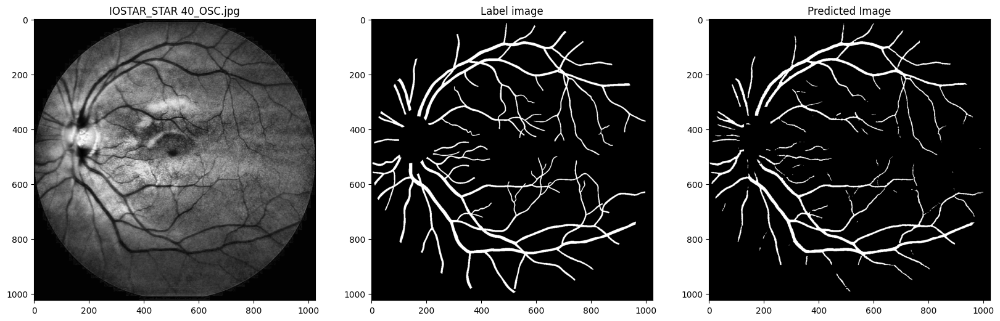

=====IOSTAR_STAR 16_OSN.jpg result======
sensitivity: 0.6662851536952257
specificity: 0.991137266890859
IOU: 0.5900122411909494


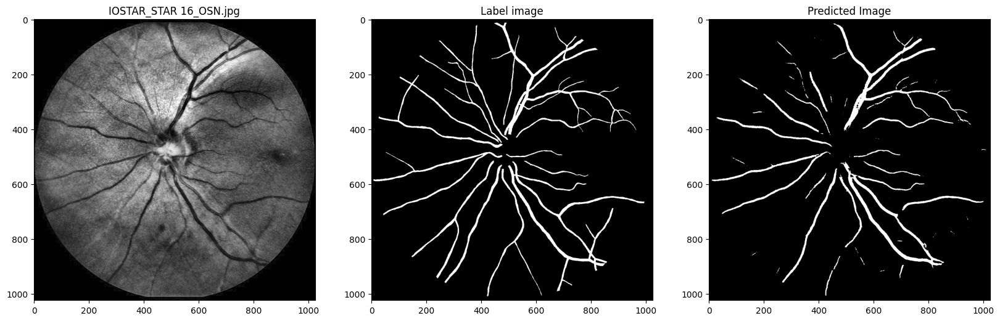

=====IOSTAR_STAR 30_ODC.jpg result======
sensitivity: 0.6037584733958585
specificity: 0.9954417179953949
IOU: 0.5745038049901148


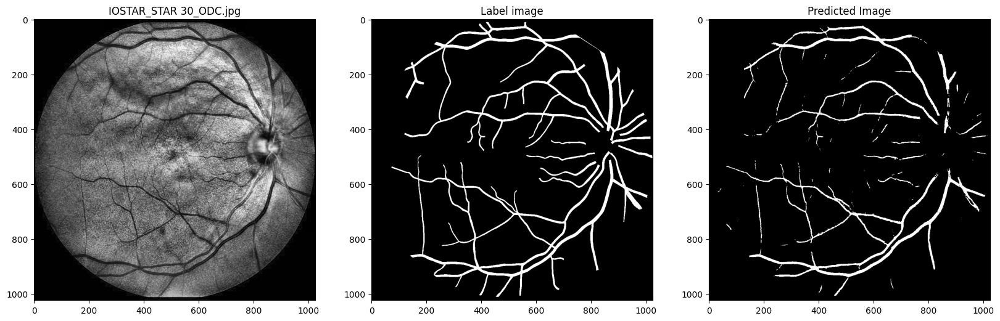

=====IOSTAR_STAR 24_OSC.jpg result======
sensitivity: 0.6136345588819185
specificity: 0.9964399425293263
IOU: 0.5867353395257017


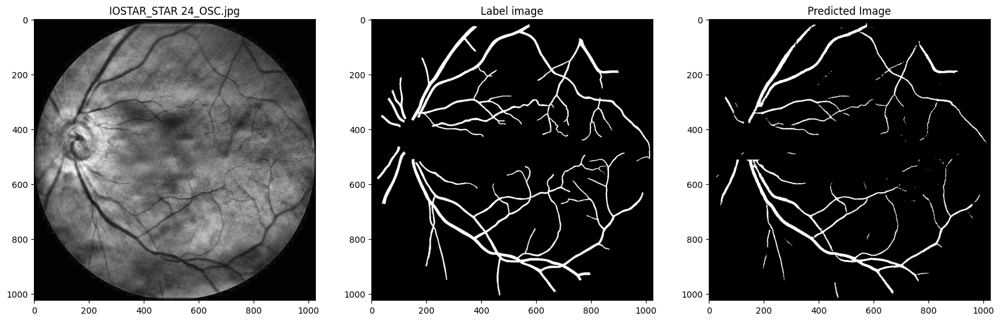

=====IOSTAR_STAR 48_OSN.jpg result======
sensitivity: 0.6986983007374158
specificity: 0.9933793597987226
IOU: 0.6455018305470315


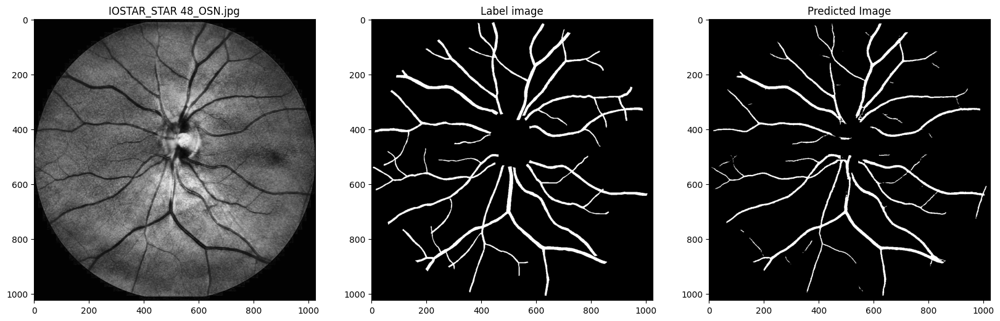

=====IOSTAR_STAR 45_ODC.jpg result======
sensitivity: 0.8323255560909641
specificity: 0.9840679588272409
IOU: 0.6692078886194915


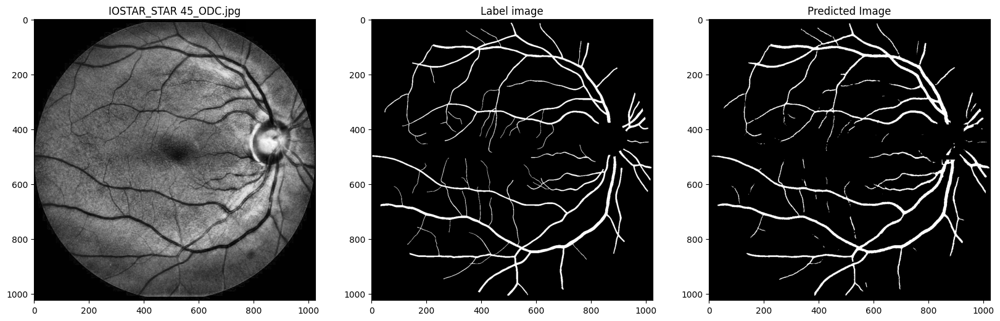

=====IOSTAR_STAR 32_ODC.jpg result======
sensitivity: 0.8005418863503222
specificity: 0.9786972506263414
IOU: 0.6130457701064342


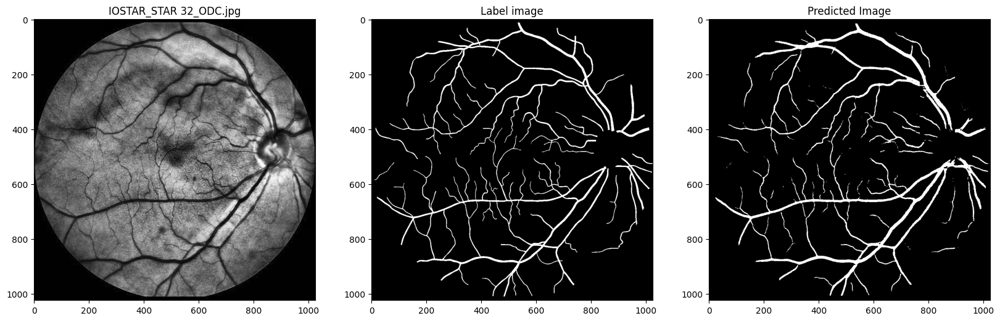

In [2]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Pyramid/model_parameters/pyramid_50ep_1024_fG_wo_slice.tf/48--0.2004-0.7765-0.9827-0.2032-0.7533-0.9852.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "IOSTAR", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)

=====HRF_02_h.jpg result======
sensitivity: 0.8190371314864187
specificity: 0.987248320727325
IOU: 0.7336361669911313


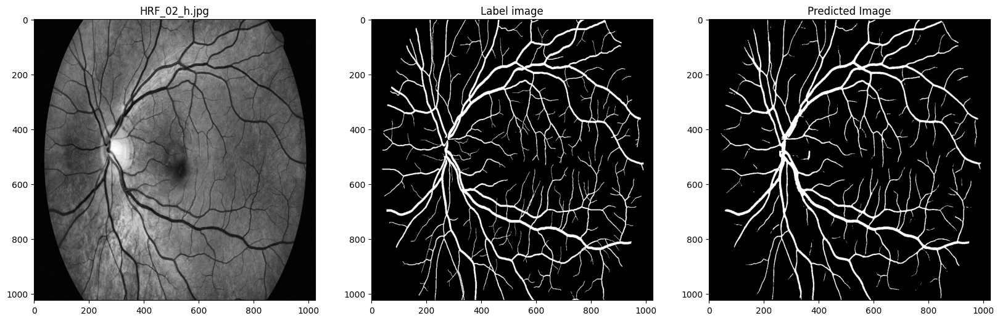

=====HRF_03_h.jpg result======
sensitivity: 0.7155047089311675
specificity: 0.988891365056956
IOU: 0.6539842363718896


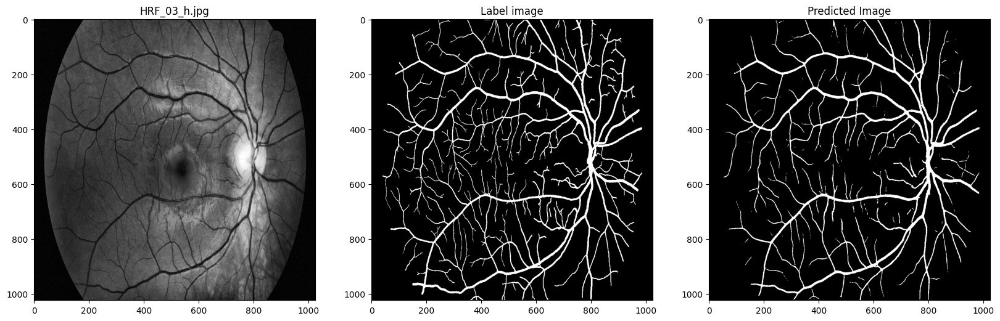

=====HRF_05_g.jpg result======
sensitivity: 0.8360531309297913
specificity: 0.9759475382270174
IOU: 0.6220257810888004


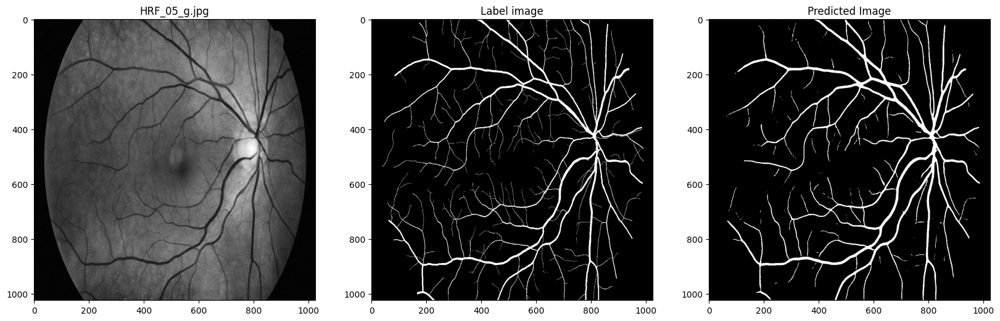

=====HRF_06_h.jpg result======
sensitivity: 0.8206210969829207
specificity: 0.9833600071318803
IOU: 0.7151638840394403


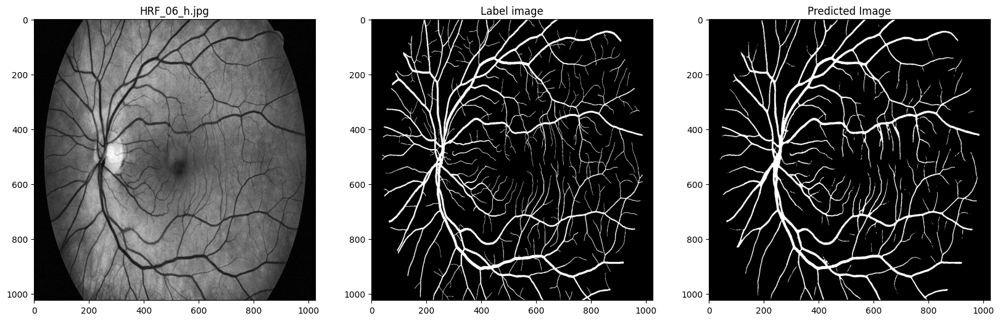

=====HRF_01_h.jpg result======
sensitivity: 0.7619645231985315
specificity: 0.984924644458177
IOU: 0.6725357934067387


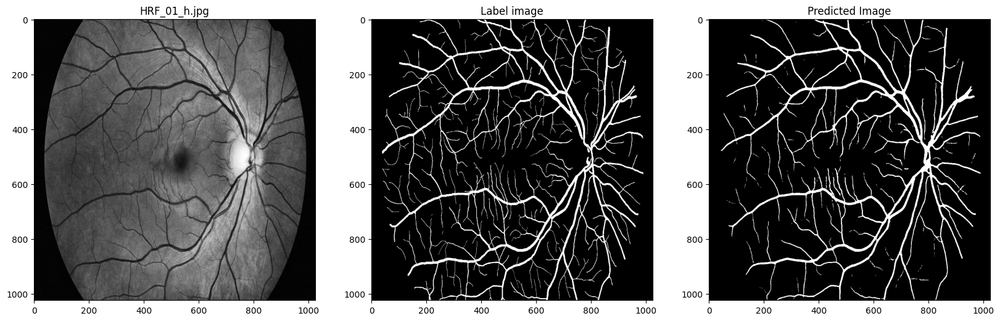

=====HRF_01_dr.JPG result======
sensitivity: 0.8496099393238948
specificity: 0.9547854661793393
IOU: 0.3654792681714229


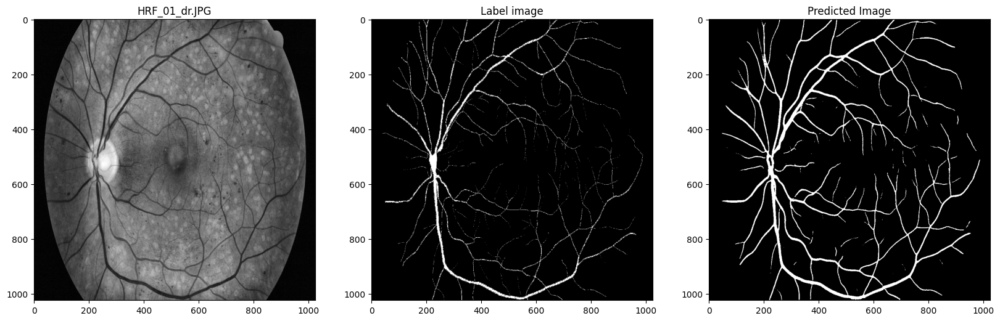

=====HRF_01_dr.JPG result======
sensitivity: 0.8265170391741762
specificity: 0.968715804577778
IOU: 0.5220267184153542


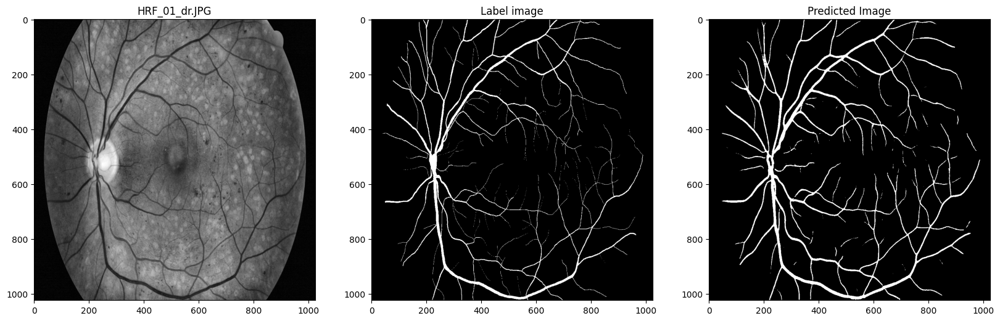

=====HRF_03_g.jpg result======
sensitivity: 0.8250020683378837
specificity: 0.9771611541267896
IOU: 0.6006891317181307


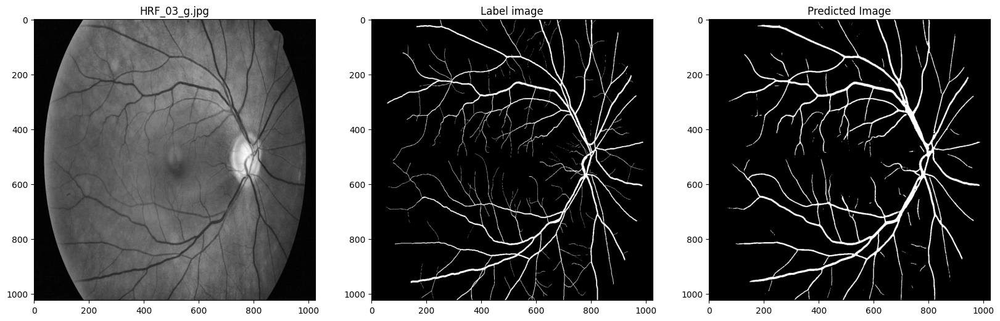

=====HRF_01_g.jpg result======
sensitivity: 0.8274976457495078
specificity: 0.9690911506504921
IOU: 0.57805242699093


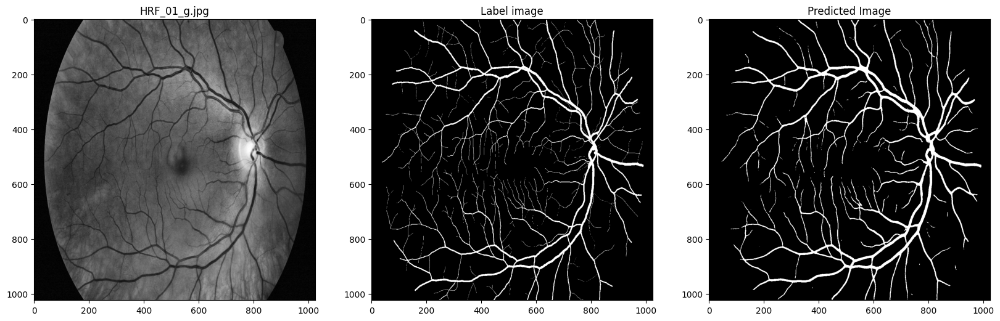

=====HRF_03_dr.JPG result======
sensitivity: 0.8426025595024519
specificity: 0.9605739537590972
IOU: 0.4322191955630813


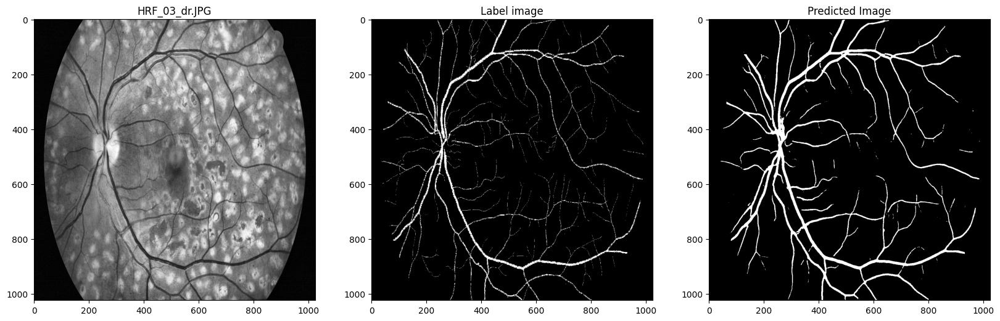

=====HRF_03_dr.JPG result======
sensitivity: 0.8157334552736561
specificity: 0.9764656800895695
IOU: 0.5973511616091636


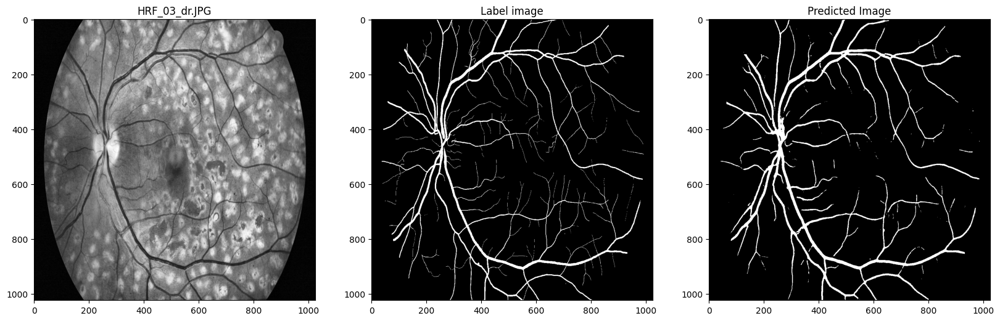

=====HRF_07_g.jpg result======
sensitivity: 0.8098944591029024
specificity: 0.9775775330594192
IOU: 0.6125252211702623


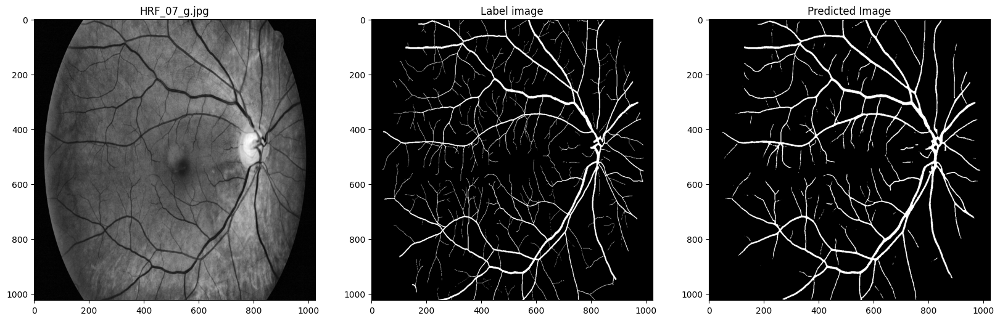

=====HRF_02_g.jpg result======
sensitivity: 0.8350372818817742
specificity: 0.970843525443009
IOU: 0.6128574249419375


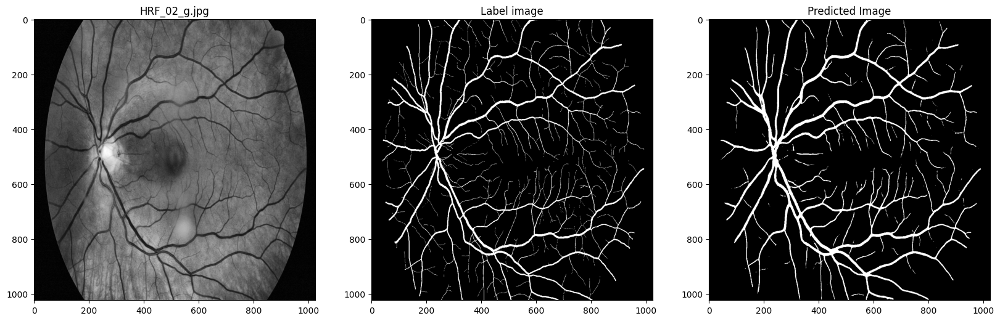

=====HRF_02_dr.JPG result======
sensitivity: 0.839684656233186
specificity: 0.9568445530999802
IOU: 0.4166260417392112


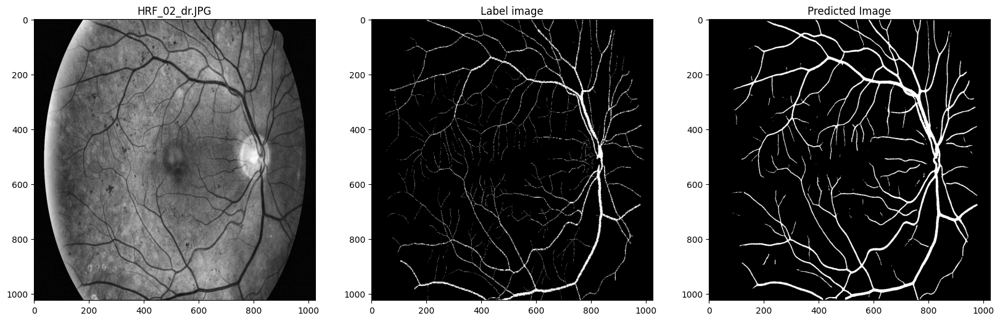

=====HRF_02_dr.JPG result======
sensitivity: 0.8150175753496373
specificity: 0.9747249982428816
IOU: 0.594405899550552


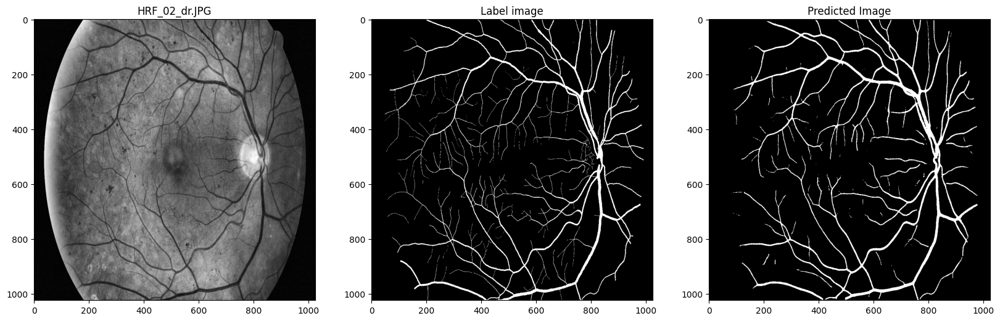

=====HRF_10_h.jpg result======
sensitivity: 0.7361203420621206
specificity: 0.9911384743817176
IOU: 0.6728292564393326


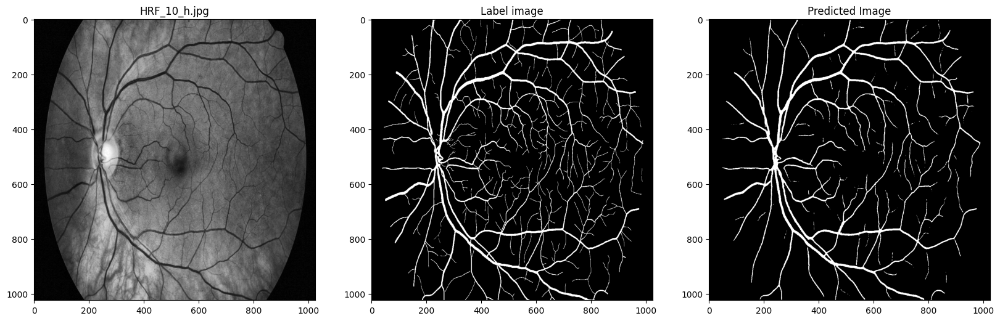

In [3]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Pyramid/model_parameters/pyramid_50ep_1024_fG_wo_slice.tf/48--0.2004-0.7765-0.9827-0.2032-0.7533-0.9852.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "HRF", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)